# Configuring Kaggle, getting the Flickr8k dataset and then unzipping it into the data folder

Installing Kaggle

In [ ]:
!pip install -q kaggle
from google.colab import files

Uploading the json file

In [ ]:
files.upload()

Configuring connection

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Getting the data and then unzipping it

In [ ]:
!kaggle datasets download -d adityajn105/flickr8k -p data
!unzip -q data/flickr8k.zip -d data

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0


# Importing the necessary libraries

In [ ]:
import os
import re

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms,models


from PIL import Image
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.corpus import stopwords

from collections import Counter
from wordcloud import WordCloud
from tqdm import tqdm

from sklearn.model_selection import train_test_split

from transformers import DistilBertTokenizer, DistilBertModel
from torch.utils.tensorboard import SummaryWriter

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

# Data inspections and EDA

## Captions related inspections

In [ ]:
captions_df = pd.read_csv('data/captions.txt')

In [ ]:
captions_df.head(10)

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...
7,1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots a...
8,1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each o...
9,1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .


In [ ]:
captions_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40455 entries, 0 to 40454
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   image    40455 non-null  object
 1   caption  40455 non-null  object
dtypes: object(2)
memory usage: 632.2+ KB


In [ ]:
num_images = captions_df['image'].nunique()
num_captions = len(captions_df)

avg_caption_per_img = num_captions/num_images

print(f"Total images: {num_images}")
print(f"Total captions: {num_captions}")
print(f"Average captions per image: {avg_caption_per_img:.2f}")

Total images: 8091
Total captions: 40455
Average captions per image: 5.00


In [ ]:
captions_df['caption_length'] = captions_df['caption'].apply(lambda x: len(x.split()))

captions_df.head(10)

,image,caption,caption_length
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,18
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,8
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,9
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,10
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,13
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting,9
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...,15
7,1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots a...,19
8,1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each o...,13
9,1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .,9


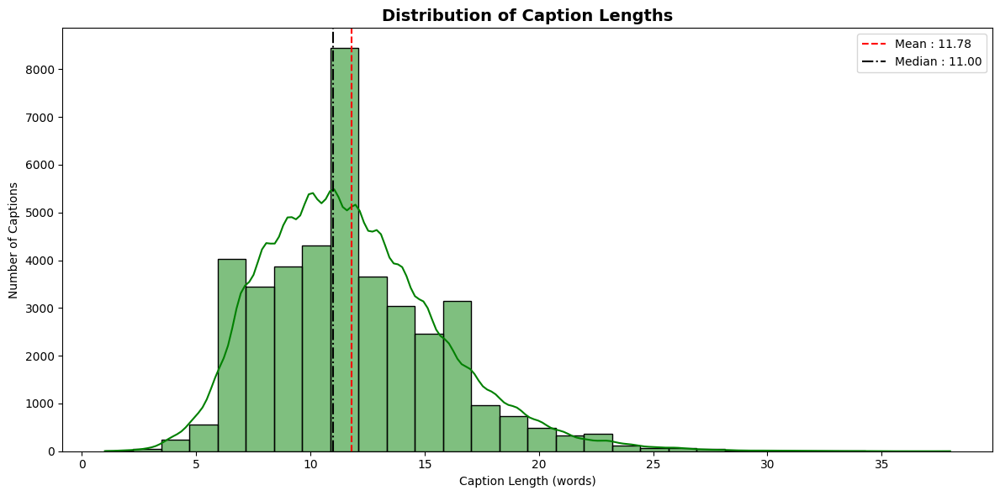

In [ ]:
plt.figure(figsize= (12,6))

mean_cap_length = captions_df['caption_length'].mean()
median_cap_length = captions_df['caption_length'].median()

sns.histplot(captions_df['caption_length'], bins = 30, color='green',kde=True)

plt.axvline(mean_cap_length, color = 'red', linestyle = '--', linewidth =1.5,label=f'Mean : {mean_cap_length:.2f}')
plt.axvline(median_cap_length, color = 'black', linestyle = '-.', linewidth = 1.5, label = f'Median : {median_cap_length:.2f}')

plt.title("Distribution of Caption Lengths",fontsize=14, fontweight='bold')
plt.xlabel("Caption Length (words)")
plt.ylabel("Number of Captions")

plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
def clean_caption(caption):
    caption = caption.lower()
    caption = re.sub(r"[^a-z0-9\s']", '', caption)
    caption = re.sub(r"\s+", " ", caption).strip()
    return caption

captions_df_copy = captions_df[::]
captions_df_copy['caption'] = captions_df_copy['caption'].apply(clean_caption)
captions_df_copy.head()

,image,caption,caption_length
0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...,18
1,1000268201_693b08cb0e.jpg,a girl going into a wooden building,8
2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse,9
3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...,10
4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...,13


In [ ]:
all_words = [word.lower() for caption in captions_df_copy['caption'] for word in caption.split()]

stop_words = set(stopwords.words('english'))
all_words = [word for word in all_words if word not in stop_words]

word_freq = Counter(all_words)

print('--------------------------------------------')
print(f"Vocabulary size: {len(word_freq)}")
print('--------------------------------------------')
print("Top 15 most common words:")
print('--------------------------------------------')
most_common_df = pd.DataFrame(word_freq.most_common(15), columns=['Word', 'Frequency'])
print(most_common_df)

--------------------------------------------
Vocabulary size: 8716
--------------------------------------------
Top 15 most common words:
--------------------------------------------
       Word  Frequency
0       dog       8136
1       man       7265
2       two       5638
3     white       3940
4     black       3832
5       boy       3581
6     woman       3402
7      girl       3328
8   wearing       3062
9    people       2883
10    water       2783
11      red       2672
12    young       2630
13    brown       2563
14     blue       2268


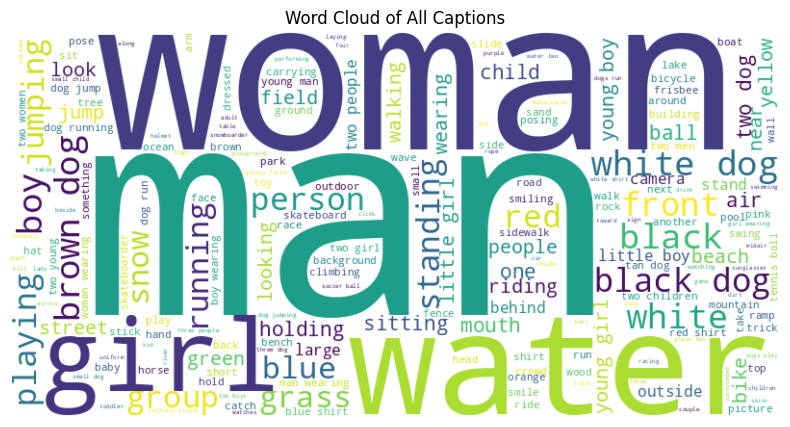

In [ ]:
text_blob = " ".join(captions_df['caption'].values).lower()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_blob)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of All Captions")
plt.show()

## Image related inspections

In [ ]:
image_dir = "data/Images"

image_files = os.listdir(image_dir)

widths, heights = [], []

for img_file in image_files:
    img_path = os.path.join(image_dir, img_file)
    with Image.open(img_path) as img:
        w, h = img.size
        widths.append(w)
        heights.append(h)

avg_width = sum(widths) / len(widths)
avg_height = sum(heights) / len(heights)

max_width = max(widths)
max_height = max(heights)

min_width = min(widths)
min_height = min(heights)
print("---------------------------------------------------")
print("Inspecting the heights and widths of the images")
print("---------------------------------------------------")
print(f"Average width: {avg_width:.2f}")
print(f"Average height: {avg_height:.2f}")
print()
print(f"Max width: {max_width}")
print(f"Max height: {max_height}")
print()
print(f"Min width: {min_width}")
print(f"Min height: {min_height}")

---------------------------------------------------
Inspecting the heights and widths of the images
---------------------------------------------------
Average width: 457.87
Average height: 397.25

Max width: 500
Max height: 500

Min width: 164
Min height: 127


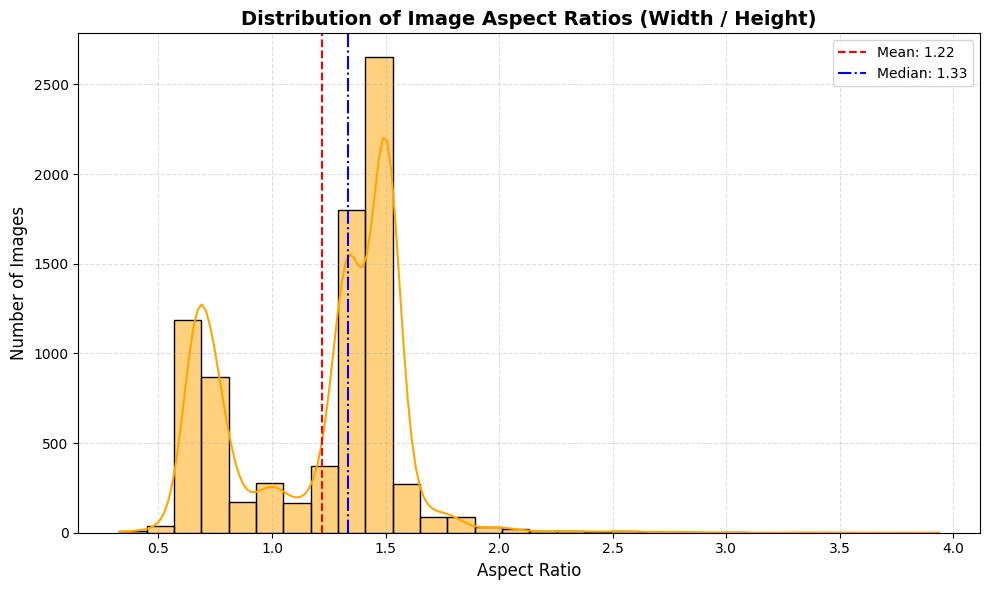

In [ ]:
aspect_ratios = [w / h for w, h in zip(widths, heights)]

mean_ar = sum(aspect_ratios) / len(aspect_ratios)

median_idx = len(aspect_ratios) // 2 # N/2
sorted_aspect_ratios = sorted(aspect_ratios)
median_ar = sorted_aspect_ratios[median_idx]

plt.figure(figsize=(10, 6))
sns.histplot(aspect_ratios, bins=30, kde=True, color='orange', edgecolor='black')

# Vertical lines for mean and median
plt.axvline(mean_ar, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_ar:.2f}')
plt.axvline(median_ar, color='blue', linestyle='-.', linewidth=1.5, label=f'Median: {median_ar:.2f}')

plt.title("Distribution of Image Aspect Ratios (Width / Height)", fontsize=14, fontweight='bold')
plt.xlabel("Aspect Ratio", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.legend()

plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

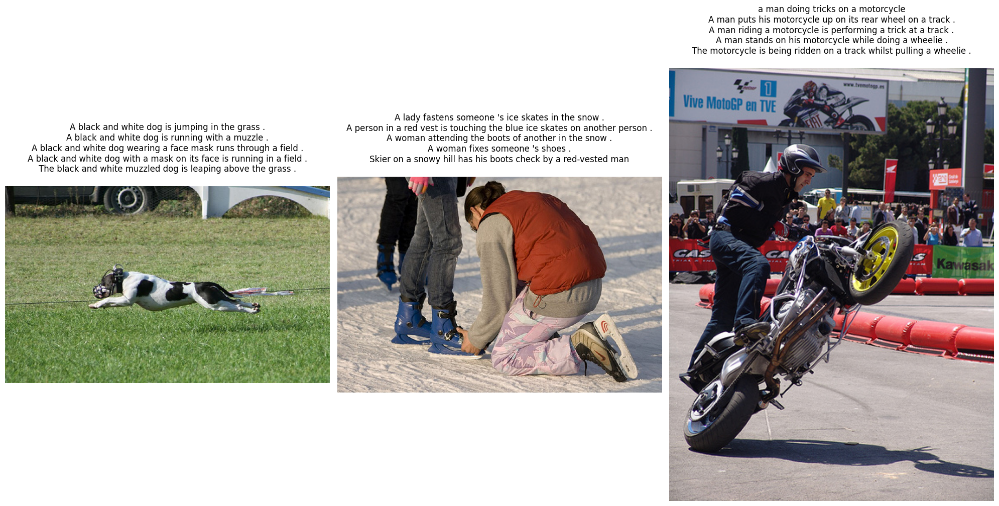

In [ ]:
fig,axes = plt.subplots(1,3,figsize = (20,10))

for ax,img_file in zip(axes,image_files[:10]):
  img_path = os.path.join(image_dir, img_file)
  img = Image.open(img_path)
  current_caption = captions_df[captions_df['image'] == img_file]['caption']
  ax.set_title(f"{current_caption.values[0]}\n{current_caption.values[1]}\n{current_caption.values[2]}\n{current_caption.values[3]}\n{current_caption.values[4]}\n")
  ax.imshow(img)
  ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
corrupt_imgs = []

for img_file in image_files:
  img_path = os.path.join(image_dir, img_file)

  try:
    with Image.open(img_path) as img:
      img.verify()

  except Exception as e:
    corrupt_imgs.append(img_file)
print("---------------------------------------------------")
print(f"Corrupt/unreadable images: {len(corrupt_imgs)}")
print("---------------------------------------------------")


---------------------------------------------------
Corrupt/unreadable images: 0
---------------------------------------------------


In [ ]:
color_modes = set()

for img_file in image_files:
  img_path = os.path.join(image_dir, img_file)

  with Image.open(img_path) as img:
    color_modes.add(img.mode)

print("---------------------------------------------------")
print("The color modes of images present in the dataset")
print("---------------------------------------------------")
print(color_modes)

---------------------------------------------------
The color modes of images present in the dataset
---------------------------------------------------
{'RGB'}


# Data Preprocessing

## Text Pre-processing

Defining a function to clean the captions using Regex

In [ ]:
def clean_caption(caption):
    caption = caption.lower()
    caption = re.sub(r"[^a-z0-9\s']", '', caption)
    caption = re.sub(r"\s+", " ", caption).strip()
    return caption

Applying the functon to the caption column of the dataframe

In [ ]:
captions_df['caption'] = captions_df['caption'].apply(clean_caption)
captions_df.head()

,image,caption,caption_length
0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...,18
1,1000268201_693b08cb0e.jpg,a girl going into a wooden building,8
2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse,9
3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...,10
4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...,13


## Image Pre-processing

Defining 2 separate functions to pre-process the image during training and pre-process the image during validation

In [ ]:
def preprocess_image_train(img_path):
  img = Image.open(img_path).convert('RGB')

  transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomHorizontalFlip(p =0.5),
        transforms.ColorJitter(brightness = (0.5, 1.2)),
        transforms.RandomRotation(10, expand = False),
        transforms.ToTensor(),
        transforms.Normalize(mean = [0.48145466, 0.4578275, 0.40821073],
                     std = [0.26862954, 0.26130258, 0.27577711])

    ])

  return transform(img)

def preprocess_image_test(img_path):
  img = Image.open(img_path).convert('RGB')

  transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean = [0.48145466, 0.4578275, 0.40821073],
                     std = [0.26862954, 0.26130258, 0.27577711])

    ])
  return transform(img)


# Creating Datasets and Dataloaders

## Flickr8k Dataset Class

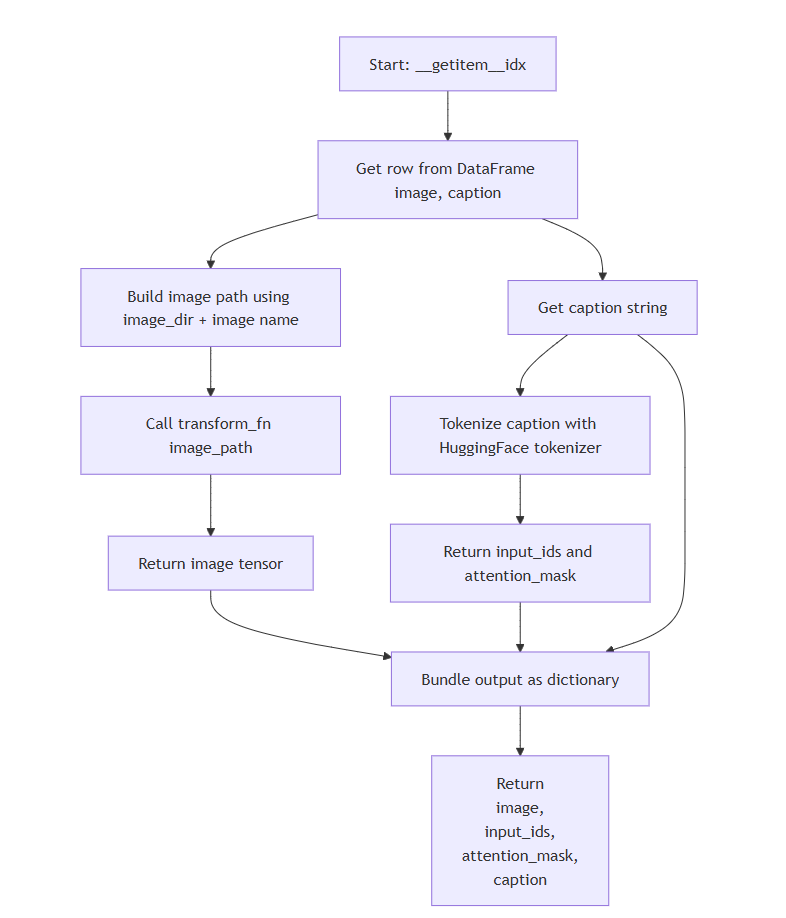

It needs
- caption_df
- image directory
- tokenizer
- transform function

Defining the custom Dataset class

In [ ]:
class Flickr8kDataset(Dataset):
    def __init__(self, dataframe, image_dir, tokenizer, transform_fn, max_length=40):
        self.dataframe = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.tokenizer = tokenizer
        self.transform_fn = transform_fn
        self.max_length = max_length

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image_path = os.path.join(self.image_dir, row['image'])

        image = self.transform_fn(image_path)

        caption = row['caption']

        tokens = self.tokenizer(
            caption,
            padding='max_length',
            truncation=True,
            max_length=self.max_length,
            return_tensors='pt'
        )

        return {
            'image': image,
            'input_ids': tokens['input_ids'].squeeze(0),
            'attention_mask': tokens['attention_mask'].squeeze(0),
            'caption': caption
        }


Initializing the pre-trained DistilBertTokenizer

In [ ]:
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

image_dir = 'data/Images'

Splitting the dataset into train and test sets and converting them into objects of the above created custom dataset class

In [ ]:
train_df,test_df = train_test_split(captions_df, test_size = 0.2, shuffle = True,random_state = 42)

train_dataset = Flickr8kDataset(
    train_df,
    image_dir = 'data/Images',
    tokenizer = tokenizer,
    transform_fn = preprocess_image_train
)

test_dataset = Flickr8kDataset(
    test_df,
    image_dir = 'data/Images',
    tokenizer = tokenizer,
    transform_fn = preprocess_image_test
)

## Creating DataLoaders

Creating data-loaders for train and validation

In [ ]:
train_loader = DataLoader(train_dataset, batch_size = 32, shuffle = True,num_workers = 2)
val_loader = DataLoader(test_dataset, batch_size = 32, shuffle = False, num_workers  = 2)

# Defining the model Architectures

## Image Encoder

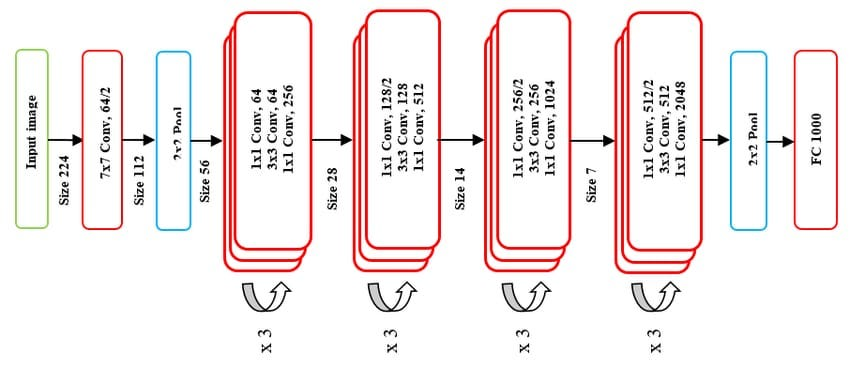

In [ ]:
class ImageEncoder(nn.Module):
  def __init__(self, embedding_dim):
    super(ImageEncoder, self).__init__()

    resnet50 = models.resnet50(pretrained = True)
    modules = list(resnet50.children()) [:-1] # Not the last classification layer

    self.model = nn.Sequential(*modules)
    self.fc1 = nn.Linear(resnet50.fc.in_features, 512)
    self.img_projection = nn.Linear(512, embedding_dim)
    self.relu = nn.ReLU()

  def forward(self, x):
    x = self.model(x).squeeze()
    x = self.relu(self.fc1(x))
    embeddings = self.img_projection(x)
    return embeddings

## Text Encoder

In [ ]:
class TextEncoder(nn.Module):
  def __init__(self, embedding_dim):
    super(TextEncoder,self).__init__()
    self.bert = DistilBertModel.from_pretrained("distilbert-base-uncased")
    self.text_projection = nn.Linear(self.bert.config.hidden_size, embedding_dim)

  def forward(self, input_ids, attention_mask):
    out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
    out = out.last_hidden_state[:, 0]  # CLS token
    embeddings = self.text_projection(out)
    return embeddings

## CLIP Model

In [ ]:
class CLIPModel(nn.Module):
    def __init__(self, embed_dim=256):
        super(CLIPModel, self).__init__()
        self.image_encoder = ImageEncoder(embed_dim)
        self.text_encoder = TextEncoder(embed_dim)

    def forward(self, input_ids, attention_mask, images):
        text_embeddings = self.text_encoder(input_ids, attention_mask)
        image_embeddings = self.image_encoder(images)

        text_embeddings = F.normalize(text_embeddings, p=2, dim=-1)
        image_embeddings = F.normalize(image_embeddings, p=2, dim=-1) ####

        return text_embeddings, image_embeddings

    def encode_text(self, input_ids, attention_mask):
        out = self.text_encoder(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = out.last_hidden_state[:, 0]
        return self.text_proj(pooled_output)

    def encode_image(self, images):
        features = self.image_encoder(images)
        return self.image_proj(features)

## Loss Function

In [ ]:
def clip_loss(text_embeds, image_embeds, temperature=0.07):
    logits_per_text = text_embeds @ image_embeds.T  # Cosine similarities
    logits_per_image = image_embeds @ text_embeds.T

    labels = torch.arange(len(text_embeds)).to(text_embeds.device)
    loss_t2i = F.cross_entropy(logits_per_text / temperature, labels)
    loss_i2t = F.cross_entropy(logits_per_image / temperature, labels)

    return (loss_t2i + loss_i2t) / 2

## Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/clip_logs --reload_interval 5

<IPython.core.display.Javascript object>

Defining a function to train the CLIP model

In [ ]:
def train_clip(
    model,
    train_loader,
    val_loader,
    optimizer,
    device,
    epochs=10,
    save_path="clip_model.pt",
    log_dir="runs/clip_logs"
):
    writer = SummaryWriter(log_dir)
    best_loss = float('inf')
    train_losses = []
    train_cosine = []
    test_losses = []

    model.to(device)

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        running_cosine = 0.0

        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")

        for batch in progress_bar:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            images = batch["image"].to(device)

            optimizer.zero_grad()

            text_embeds, image_embeds = model(input_ids, attention_mask, images)

            loss = clip_loss(text_embeds, image_embeds)
            loss.backward()
            optimizer.step()

            cosine_sim = F.cosine_similarity(text_embeds, image_embeds).mean().item()

            running_loss += loss.item()
            running_cosine += cosine_sim

            progress_bar.set_postfix(loss=loss.item(), cosine=cosine_sim)

        avg_loss = running_loss / len(train_loader)
        train_losses.append(avg_loss)
        train_cosine.append(running_cosine / len(train_loader))
        avg_cosine = running_cosine / len(train_loader)

        writer.add_scalar("Loss/train", avg_loss, epoch)
        writer.add_scalar("CosineSimilarity/train", avg_cosine, epoch)

        val_loss = evaluate_clip(model, val_loader, device)
        test_losses.append(val_loss)
        writer.add_scalar("Loss/val", val_loss, epoch)

        if val_loss < best_loss:
            best_loss = val_loss
            torch.save(model.state_dict(), save_path)
            print(f" Model saved at epoch {epoch+1} with val_loss {val_loss:.4f}")
    return train_losses, train_cosine, test_losses

Defining a evaluation function to be used during the training

In [ ]:
def evaluate_clip(model, val_loader, device):
    model.eval()
    total_loss = 0.0

    with torch.no_grad():
      for batch in val_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        images = batch["image"].to(device)

        text_embeds, image_embeds = model(input_ids, attention_mask, images)
        loss = clip_loss(text_embeds, image_embeds)
        total_loss += loss.item()

    return total_loss / len(val_loader)

# Training

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CLIPModel()
optimizer = optim.AdamW(model.parameters(), lr=0.0001)

logs = train_clip(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    device=device,
    epochs=15
)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 176MB/s]
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingfa

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Epoch 1/15: 100%|██████████| 1012/1012 [08:03<00:00,  2.09it/s, cosine=0.582, loss=0.495]


 Model saved at epoch 1 with val_loss 0.6522


Epoch 2/15: 100%|██████████| 1012/1012 [07:58<00:00,  2.11it/s, cosine=0.597, loss=0.216]


 Model saved at epoch 2 with val_loss 0.5446


Epoch 3/15: 100%|██████████| 1012/1012 [07:58<00:00,  2.11it/s, cosine=0.608, loss=0.0807]


 Model saved at epoch 3 with val_loss 0.4703


Epoch 4/15: 100%|██████████| 1012/1012 [07:57<00:00,  2.12it/s, cosine=0.658, loss=0.0581]


 Model saved at epoch 4 with val_loss 0.4453


Epoch 5/15: 100%|██████████| 1012/1012 [07:58<00:00,  2.11it/s, cosine=0.65, loss=0.0871]


 Model saved at epoch 5 with val_loss 0.4375


Epoch 6/15: 100%|██████████| 1012/1012 [07:58<00:00,  2.11it/s, cosine=0.657, loss=0.0329]


 Model saved at epoch 6 with val_loss 0.4085


Epoch 8/15: 100%|██████████| 1012/1012 [07:58<00:00,  2.12it/s, cosine=0.702, loss=0.0702]


 Model saved at epoch 8 with val_loss 0.3716


Epoch 9/15: 100%|██████████| 1012/1012 [07:56<00:00,  2.12it/s, cosine=0.647, loss=0.0494]


 Model saved at epoch 9 with val_loss 0.3654


Epoch 10/15: 100%|██████████| 1012/1012 [07:57<00:00,  2.12it/s, cosine=0.749, loss=0.00773]


 Model saved at epoch 10 with val_loss 0.3600


Epoch 15/15: 100%|██████████| 1012/1012 [07:56<00:00,  2.12it/s, cosine=0.717, loss=0.0945]


 Model saved at epoch 15 with val_loss 0.3503


## Saving the model

In [ ]:
torch.save(model.state_dict(), "final_epoch_clip.pt")

## Downloading the model

In [ ]:
files.download('final_epoch_clip.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Training Plots

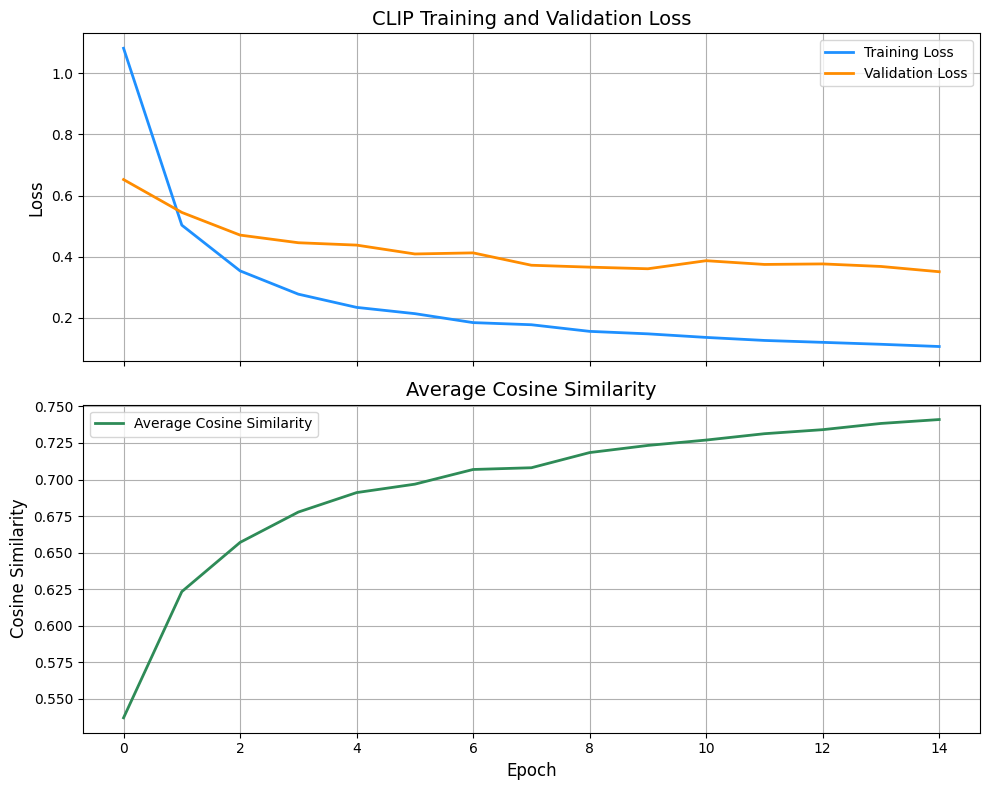

In [ ]:
train_l, cosine, val_l = logs
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

ax1.plot(train_l, label="Training Loss", color="dodgerblue", linewidth=2)
ax1.plot(val_l, label="Validation Loss", color="darkorange", linewidth=2)
ax1.set_ylabel("Loss", fontsize=12)
ax1.set_title("CLIP Training and Validation Loss", fontsize=14)
ax1.legend(fontsize=10)
ax1.grid(True)

ax2.plot(cosine, label="Average Cosine Similarity", color="seagreen", linewidth=2)
ax2.set_xlabel("Epoch", fontsize=12)
ax2.set_ylabel("Cosine Similarity", fontsize=12)
ax2.set_title("Average Cosine Similarity", fontsize=14)
ax2.legend(fontsize=10)
ax2.grid(True)

plt.tight_layout()
plt.show()

# Model Evaluation

Functions to calculate Recall@k and cosine similarities

In [ ]:
def compute_recall_at_k(similarity_matrix, k_values=[1, 5, 10]):
    similarity_matrix = similarity_matrix.cpu()
    N = similarity_matrix.size(0)
    metrics = {}

    # Text to Image
    text_to_image_ranks = similarity_matrix.argsort(dim=1, descending=True)
    gt_ranks_text = (text_to_image_ranks == torch.arange(N).unsqueeze(1)).nonzero()[:, 1]

    # Image to Text
    image_to_text_ranks = similarity_matrix.argsort(dim=0, descending=True)
    gt_ranks_image = (image_to_text_ranks == torch.arange(N).unsqueeze(0)).nonzero()[:, 0]

    for k in k_values:
        metrics[f"text_to_image_R@{k}"] = (gt_ranks_text < k).float().mean().item()
        metrics[f"image_to_text_R@{k}"] = (gt_ranks_image < k).float().mean().item()

    return metrics


def evaluate_clip_recall(model, dataloader, device, k_values=[1, 5, 10]):
    model.eval()
    all_text_embeds = []
    all_image_embeds = []

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating"):
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            images = batch["image"].to(device)

            text_embeds, image_embeds = model(input_ids, attention_mask, images)
            text_embeds = F.normalize(text_embeds, p=2, dim=-1)
            image_embeds = F.normalize(image_embeds, p=2, dim=-1)

            all_text_embeds.append(text_embeds.cpu())
            all_image_embeds.append(image_embeds.cpu())

    all_text_embeds = torch.cat(all_text_embeds, dim=0)
    all_image_embeds = torch.cat(all_image_embeds, dim=0)

    # Cosine similarity matrix
    similarity_matrix = all_text_embeds @ all_image_embeds.T

    # Recall@K
    recall_metrics = compute_recall_at_k(similarity_matrix, k_values)

    # Average cosine similarity of correct pairs (diagonal)
    diag_sim = similarity_matrix.diag().mean().item()
    recall_metrics["avg_cosine_similarity"] = diag_sim

    return recall_metrics


Calculating the metrics

In [ ]:
metrics = evaluate_clip_recall(model, val_loader, device)
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

Evaluating: 100%|██████████| 253/253 [00:54<00:00,  4.66it/s]


text_to_image_R@1: 0.1394
image_to_text_R@1: 0.1487
text_to_image_R@5: 0.3805
image_to_text_R@5: 0.3861
text_to_image_R@10: 0.5176
image_to_text_R@10: 0.5216
avg_cosine_similarity: 0.6835


In [ ]:
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df

,text_to_image_R@1,image_to_text_R@1,text_to_image_R@5,image_to_text_R@5,text_to_image_R@10,image_to_text_R@10,avg_cosine_similarity
0,0.139414,0.148684,0.380546,0.386108,0.517612,0.521567,0.683466


## Loading the saved model and inference

In [ ]:
model = CLIPModel()
model.load_state_dict(torch.load("final_epoch_clip.pt", map_location="cpu"))

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

CLIPModel(
  (image_encoder): ImageEncoder(
    (model): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)

In [ ]:
import cv2

# Inference

### Plotting the images to be used during inference so as to validate authenticity

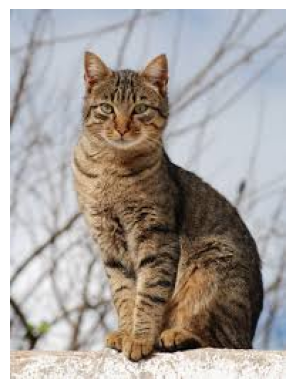

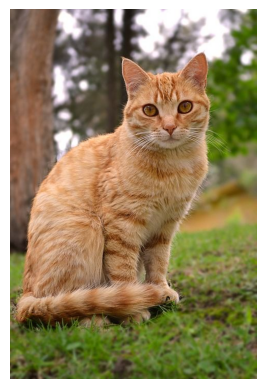

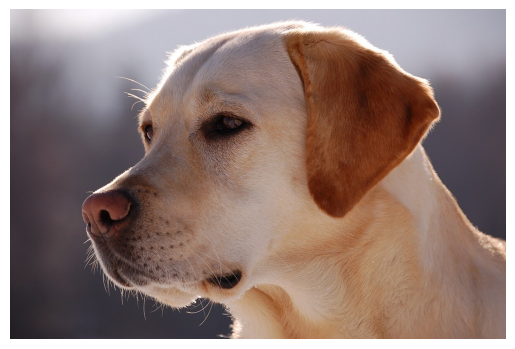

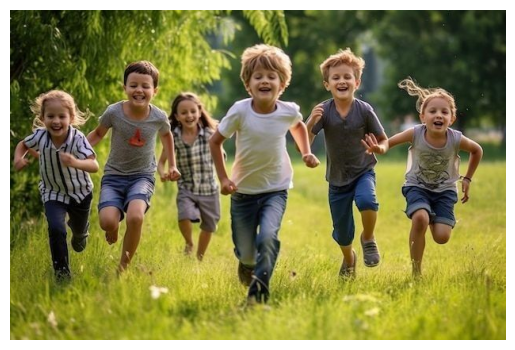

In [ ]:
cat = cv2.imread('cat.jpg')
orange_cat = cv2.imread('orange_cat.jpg')
dog = cv2.imread('dog.jpg')
children = cv2.imread('children_playing.jpg')

img_list = [cat, orange_cat, dog, children]

for img in img_list:
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  plt.imshow(img_rgb)
  plt.axis('off')
  plt.show()

### Inferencing using the model

In [ ]:
model.eval()

tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

image_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

def infer(text_list, image_paths, model, tokenizer, transform, device):
    encoding = tokenizer(
        text_list,
        padding=True,
        truncation=True,
        return_tensors="pt"
    )

    input_ids = encoding["input_ids"].to(device)
    attention_mask = encoding["attention_mask"].to(device)

    images = []
    for path in image_paths:
        img = Image.open(path).convert("RGB")
        images.append(transform(img))

    images = torch.stack(images).to(device)

    with torch.no_grad():
        txt_embeds, img_embeds = model(input_ids, attention_mask, images)

        # Similarity matrix
        sims = (txt_embeds @ img_embeds.T).cpu()  # [N_text, N_image]

        scores = sims.diag().tolist()

    return scores, sims

print("--------------------------------------------------------")
print("Mapping correct captions to correct images")
print("--------------------------------------------------------")
texts = ["a photo of a white cat", "a photo of a dog", "a ginger cat in green grass", "children running on a sunny day"]
images = ["cat.jpg", "dog.jpg","orange_cat.jpg","children_playing.jpg"]
scores, similarity_matrix = infer(texts, images, model, tokenizer, image_transform, device)

for t, p, s in zip(texts, images, scores):
    print(f"Similarity(“{t}”, {p}) = {s:.4f}")

print("--------------------------------------------------------")
print("Mapping incorrect captions to correct images")
print("--------------------------------------------------------")
texts = ["a photo of a white cat", "a white dog looking left", "an orange cat in green grass", "children running on a sunny day"]
images = ["dog.jpg","orange_cat.jpg","children_playing.jpg","cat.jpg",]
scores, similarity_matrix = infer(texts, images, model, tokenizer, image_transform, device)

for t, p, s in zip(texts, images, scores):
    print(f"Similarity(“{t}”, {p}) = {s:.4f}")

--------------------------------------------------------
Mapping correct captions to correct images
--------------------------------------------------------
Similarity(“a photo of a white cat”, cat.jpg) = 0.5079
Similarity(“a photo of a dog”, dog.jpg) = 0.4985
Similarity(“a ginger cat in green grass”, orange_cat.jpg) = 0.4429
Similarity(“children running on a sunny day”, children_playing.jpg) = 0.5701
--------------------------------------------------------
Mapping incorrect captions to correct images
--------------------------------------------------------
Similarity(“a photo of a white cat”, dog.jpg) = 0.2564
Similarity(“a white dog looking left”, orange_cat.jpg) = 0.1812
Similarity(“an orange cat in green grass”, children_playing.jpg) = -0.2240
Similarity(“children running on a sunny day”, cat.jpg) = -0.2218
